# Quality Control on IMC spatial proteomics with Harpy

## Introduction

This noteboook outlines some quality controls steps for highly-multiplexed spatial proteomics data using the Harpy package. Most steps are similar to [this good resource on Imaging Mass Cytometry data analysis in R](https://bodenmillergroup.github.io/IMCDataAnalysis/image-and-cell-level-quality-control.html#image-and-cell-level-quality-control) from the Bodenmiller lab. For comparison, the [same dataset](https://zenodo.org/records/5949116) (IMC data from the Hyperion imaging system) analyzed with [steinbock](https://zenodo.org/records/7624451) is used in this notebook. The dataset is available in Python as a [SpatialData dataset](https://spatialdata.scverse.org/en/latest/tutorials/notebooks/datasets/README.html).

The levels of quality control are:

- **Image level**: to give an overview of the quality of the images in the dataset.
- **Segmentation level**: to give an overview of the quality of the segmentation in the dataset.
- **Cell level**: to give an overview of the quality of the calculated features per cell in the dataset.

We start by loading in an example dataset and visualising the data:


In [2]:
%load_ext autoreload
%autoreload 2

import sparrow as sp
import spatialdata_plot
import spatialdata as sd
import matplotlib.pyplot as plt
import scanpy as sc
from sparrow.datasets.proteomics import imc_example
plt.viridis()

sdata = imc_example()
sdata

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


the value of the environment variable BASIC_DCT_BACKEND is not in ["JAX","SCIPY"]


SpatialData object
├── Images
│     ├── 'Patient1_001_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient1_002_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient1_003_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient2_001_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient2_002_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient2_003_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient2_004_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient3_001_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient3_002_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient3_003_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient4_005_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient4_006_image': DataArray[cyx] (40, 600, 600)
│     ├── 'Patient4_007_image': DataArray[cyx] (40, 600, 600)
│     └── 'Patient4_008_image': DataArray[cyx] (40, 600, 600)
├── Labels
│     ├── 'Patient1_001_labels': DataArray[yx] (600, 600)
│     ├── 'Patient1_002_labels': 

<Figure size 640x480 with 0 Axes>

In [3]:
sdata.table

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/4181403938.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table


AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'cell_id', 'region', 'sample_id', 'patient_id', 'ROI', 'indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [4]:
sdata.table.to_df()

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/3893341593.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table.to_df()


,MPO,HistoneH3,SMA,CD16,CD38,HLADR,CD27,CD15,CD45RA,CD163,...,VISTA,CD40,CD4,CD14,Ecad,CD303,CD206,cleavedPARP,DNA1,DNA2
Object 1 in Patient1_001.tiff,0.575106,3.127308,0.260094,2.034775,0.253014,4.111773,2.307456,7.300499,1.535942,2.166430,...,5.509909,5.162859,7.398499,23.098799,140.415451,9.861239,1.502746,0.672675,75.195312,142.235321
Object 2 in Patient1_001.tiff,0.416667,11.359788,1.672038,2.588054,0.682667,7.646656,1.587182,8.823277,2.303773,6.265749,...,4.544585,5.389460,7.441268,33.736485,65.583473,4.470543,9.239043,0.939726,73.576645,129.302673
Object 3 in Patient1_001.tiff,0.497549,2.384144,0.153519,2.294307,1.190298,13.193821,2.657502,5.005493,1.638779,8.174764,...,4.400037,5.853950,7.854741,26.709986,106.939453,6.576359,4.165048,1.148231,71.255905,119.832062
Object 4 in Patient1_001.tiff,0.890154,7.712961,1.193948,15.629084,2.126060,138.590393,6.149451,5.903136,2.424042,19.541658,...,4.765517,15.262775,24.683125,81.283867,96.895164,7.853501,6.633181,1.260584,59.181263,99.848030
Object 5 in Patient1_001.tiff,0.181818,1.451272,0.298670,0.608422,0.291779,5.911579,0.958761,8.756398,1.549757,0.529756,...,2.797691,1.359595,4.253781,8.609590,74.317711,4.970934,1.286630,0.512645,10.164272,12.806628
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Object 2841 in Patient4_008.tiff,0.127660,7.424975,0.473410,0.160480,0.230139,0.281806,0.189742,1.311998,0.682346,0.183106,...,0.547729,0.195831,1.727591,3.871677,25.318060,1.705843,0.298129,0.258668,103.932419,180.427872
Object 2842 in Patient4_008.tiff,0.117647,8.225169,0.339634,0.280664,0.374028,0.180113,0.557850,1.664211,0.889153,0.000000,...,0.495479,0.305937,1.954891,5.834383,32.321331,1.414846,0.499866,0.118527,105.321434,187.471375
Object 2843 in Patient4_008.tiff,0.146341,4.159492,0.390537,0.325213,0.340863,0.524208,0.496114,1.371000,0.791754,0.094179,...,0.305323,0.074817,1.589985,4.659936,33.211224,1.783822,0.370879,0.313851,88.465622,164.969193
Object 2844 in Patient4_008.tiff,0.167724,2.898857,0.334794,0.620313,0.083333,0.536346,0.639925,13.249680,0.893656,0.114361,...,0.459324,0.282099,1.955293,6.207744,28.697414,1.973373,0.534088,0.325632,28.828003,50.687141


In [5]:
sdata.table.obs

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/4204772674.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table.obs


,Image,area,centroid-0,centroid-1,axis_major_length,axis_minor_length,eccentricity,image,image_width_px,image_height_px,...,image_acquisition_end_x_um,image_acquisition_end_y_um,image_acquisition_width_um,image_acquisition_height_um,cell_id,region,sample_id,patient_id,ROI,indication
Object 1 in Patient1_001.tiff,Patient1_001.tiff,12,0.416667,468.583333,7.406234,1.895294,0.966702,Patient1_001.tiff,600,600,...,38100.828,17156.254,600.0,600.0,1,Patient1_001_labels,Patient1_001,Patient1,001,SCCHN
Object 2 in Patient1_001.tiff,Patient1_001.tiff,24,0.416667,515.833333,16.480040,1.962838,0.992882,Patient1_001.tiff,600,600,...,38100.828,17156.254,600.0,600.0,2,Patient1_001_labels,Patient1_001,Patient1,001,SCCHN
Object 3 in Patient1_001.tiff,Patient1_001.tiff,17,0.470588,587.235294,9.850849,1.985817,0.979470,Patient1_001.tiff,600,600,...,38100.828,17156.254,600.0,600.0,3,Patient1_001_labels,Patient1_001,Patient1,001,SCCHN
Object 4 in Patient1_001.tiff,Patient1_001.tiff,24,1.250000,192.250000,8.082904,3.915780,0.874818,Patient1_001.tiff,600,600,...,38100.828,17156.254,600.0,600.0,4,Patient1_001_labels,Patient1_001,Patient1,001,SCCHN
Object 5 in Patient1_001.tiff,Patient1_001.tiff,22,0.909091,231.772727,8.793666,3.116532,0.935091,Patient1_001.tiff,600,600,...,38100.828,17156.254,600.0,600.0,5,Patient1_001_labels,Patient1_001,Patient1,001,SCCHN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Object 2841 in Patient4_008.tiff,Patient4_008.tiff,47,597.255319,357.680851,12.607573,5.160594,0.912389,Patient4_008.tiff,600,600,...,28302.627,6595.411,600.0,600.0,2841,Patient4_008_labels,Patient4_008,Patient4,008,CRC
Object 2842 in Patient4_008.tiff,Patient4_008.tiff,17,597.764706,367.058824,5.415619,3.980897,0.677984,Patient4_008.tiff,600,600,...,28302.627,6595.411,600.0,600.0,2842,Patient4_008_labels,Patient4_008,Patient4,008,CRC
Object 2843 in Patient4_008.tiff,Patient4_008.tiff,41,597.731707,136.341463,13.102653,4.112542,0.949466,Patient4_008.tiff,600,600,...,28302.627,6595.411,600.0,600.0,2843,Patient4_008_labels,Patient4_008,Patient4,008,CRC
Object 2844 in Patient4_008.tiff,Patient4_008.tiff,24,597.833333,232.291667,7.790156,4.103809,0.849993,Patient4_008.tiff,600,600,...,28302.627,6595.411,600.0,600.0,2844,Patient4_008_labels,Patient4_008,Patient4,008,CRC


/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient1_001_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient1_002_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient1_003_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient2_001_labels', which is not present in the 

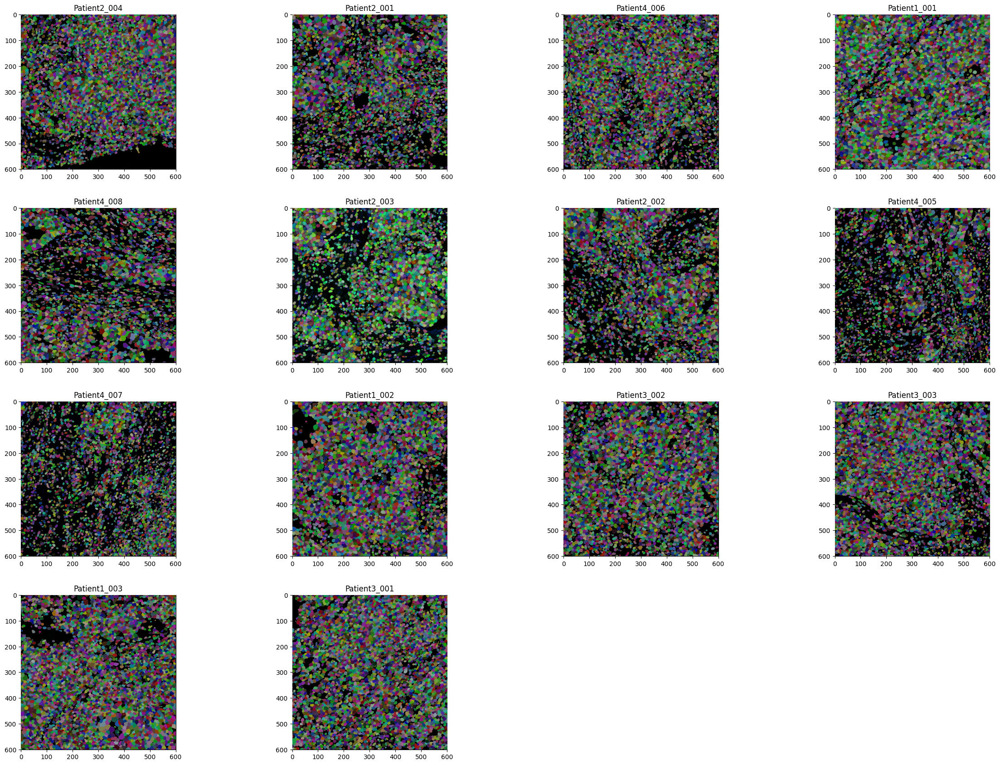

In [6]:
selected_markers = ['MPO', 'HistoneH3', 'SMA']
sdata.pl.render_images(channel=selected_markers).pl.render_labels().pl.show()

## Image level quality control


In [7]:
df = sp.pl.calculate_snr_ratio(sdata)
df

2024-09-27 01:56:00.436 | DEBUG    | sparrow.plot._qc_image:calculate_snr_ratio:32 - Calculating SNR ratio


,image,cycle,channel,snr,signal
0,Patient1_001_image,None,MPO,547.535156,1.241055
1,Patient1_001_image,None,HistoneH3,5.745501,7.948751
2,Patient1_001_image,None,SMA,13.119742,2.827469
3,Patient1_001_image,None,CD16,12.360662,8.994999
4,Patient1_001_image,None,CD38,13.662168,5.337214
...,...,...,...,...,...
555,Patient4_008_image,None,CD303,9.104072,3.356459
556,Patient4_008_image,None,CD206,36.433674,14.416249
557,Patient4_008_image,None,cleavedPARP,1098.977173,1.388665
558,Patient4_008_image,None,DNA1,6.867725,168.084061


2024-09-27 01:56:06.527 | DEBUG    | sparrow.plot._qc_image:snr_ratio:54 - Plotting SNR ratio
2024-09-27 01:56:06.540 | DEBUG    | sparrow.plot._qc_image:calculate_snr_ratio:32 - Calculating SNR ratio
/Users/benjaminr/Documents/GitHub/harpy/src/sparrow/plot/_qc_image.py:76: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


<Axes: xlabel='Signal intensity', ylabel='Signal-to-noise ratio'>

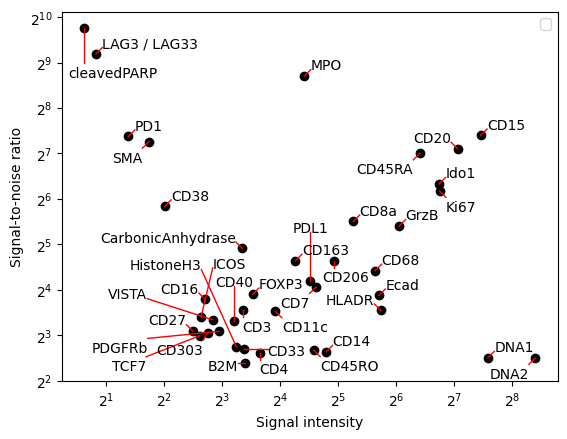

In [8]:
sp.pl.snr_ratio(sdata)

2024-09-27 01:56:13.121 | DEBUG    | sparrow.plot._qc_image:snr_ratio:54 - Plotting SNR ratio
2024-09-27 01:56:13.130 | DEBUG    | sparrow.plot._qc_image:calculate_snr_ratio:32 - Calculating SNR ratio
/Users/benjaminr/Documents/GitHub/harpy/src/sparrow/plot/_qc_image.py:76: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


<Axes: xlabel='Signal intensity', ylabel='Signal-to-noise ratio'>

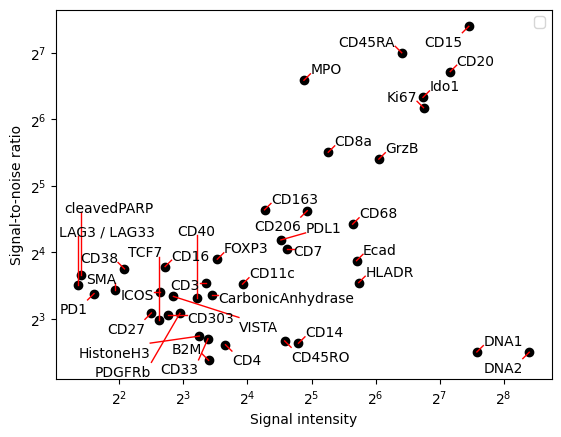

In [9]:
sp.pl.snr_ratio(sdata, signal_threshold=2)

The plots above summarize all samples together. It would be interesting to look without cell segmentation bias across all channels and samples. There are multiple ways to aggregate the channel signal on an image level to a heatmap. One way is to create heatmaps using the SNR and signal values calculated above. This again depends on the unsupervised Otsu thresholding and is not a very good proxy of a good cell segmentation.

When showing the heatmap you could use the z_score or standard_scale options, but it's also interesting not to transform the data too much in order to still visualize the outliers.

2024-09-27 01:56:19.614 | DEBUG    | sparrow.plot._qc_image:calculate_snr_ratio:32 - Calculating SNR ratio


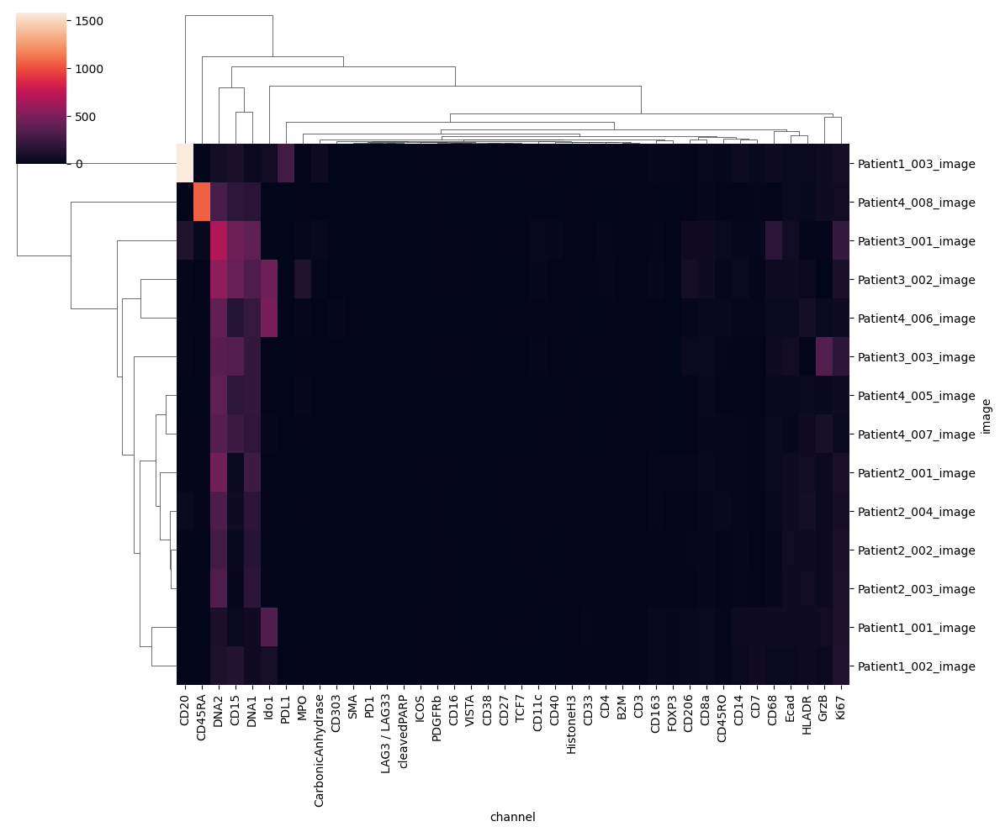

In [10]:
sp.pl.signal_clustermap(sdata, signal_threshold=2, figsize=(12,10))

2024-09-27 01:56:25.980 | DEBUG    | sparrow.plot._qc_image:calculate_snr_ratio:32 - Calculating SNR ratio


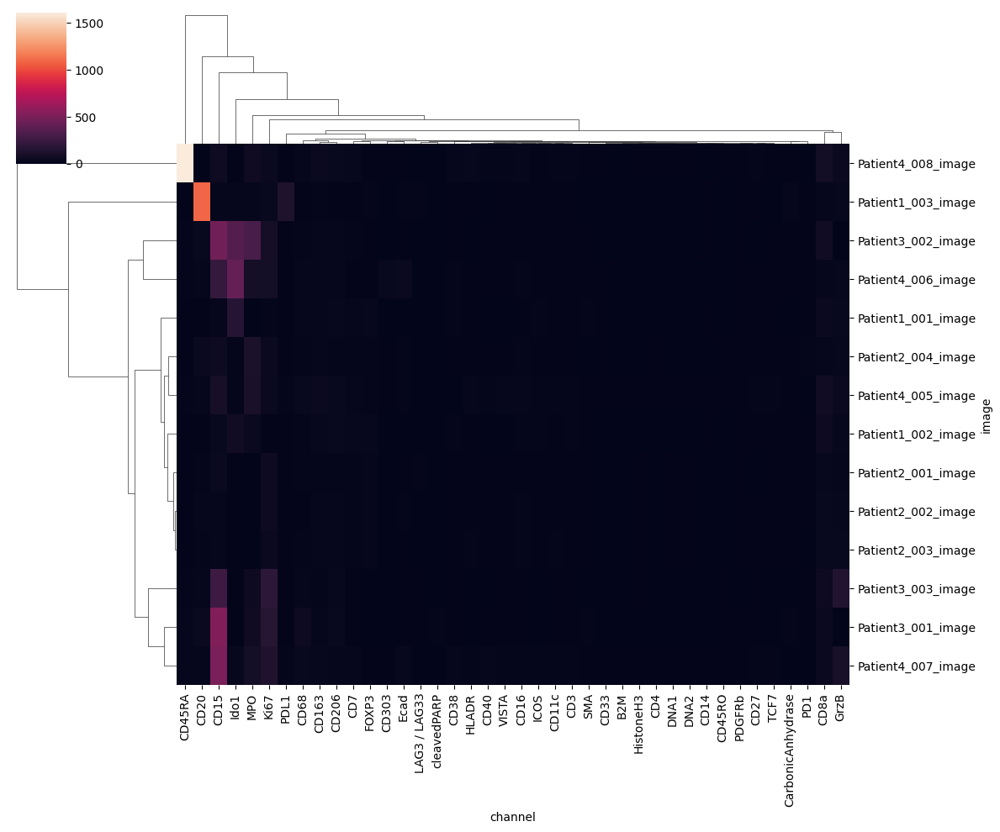

In [11]:
sp.pl.snr_clustermap(sdata, signal_threshold=2, figsize=(12,10))

Another way is to normalize the image with a quartile normalization. The min and max quartile can greatly influence how the ends of the intensity distributions. Here we clip the signal below and above the 5th and 95th percentile. We also apply an arcsinh transformation to each channel against extreme outliers to make the heatmap more interpretable.

In [12]:
df_norm = sp.pl.calculate_mean_norm(sdata, overwrite=True, q_min=5, q_max=95, c_mask=["DNA1", "DNA2"])
df_norm

2024-09-27 01:56:32,267 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-09-27 01:56:32,950 - sparrow.image._manager - INFO - Writing results to layer 'normalized_Patient1_001_image'
2024-09-27 01:56:32,987 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-09-27 01:56:33,347 - sparrow.image._manager - INFO - Writing results to layer 'normalized_Patient1_002_image'
2024-09-27 01:56:33,370 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-09-27 01:56:33,774 - sparrow.image._manager - INFO - Writing results to layer 'normalized_Patient1_003_image'
2024-09-27 01:56:33,821 - sparrow.image._manager - WARNING - No dims parameter specified. Assuming order of dimension of provided array is ((c), (z), y, x)
2024-09-27 01:56:34,184 - sparr

,MPO,HistoneH3,SMA,CD16,CD38,HLADR,CD27,CD15,CD45RA,CD163,...,CD33,Ki67,VISTA,CD40,CD4,CD14,Ecad,CD303,CD206,cleavedPARP
image_name,,,,,,,,,,,,,,,,,,,,,
Patient1_001_image,0.001373,0.055785,0.005045,0.026264,0.008826,0.175229,0.020593,0.054659,0.013744,0.056766,...,0.074157,0.267642,0.032680,0.034993,0.074261,0.218794,0.456826,0.036260,0.032173,0.003076
Patient1_002_image,0.006060,0.049233,0.004587,0.020164,0.005141,0.165615,0.015160,0.111997,0.013541,0.043220,...,0.037956,0.307081,0.037028,0.025349,0.062264,0.176832,0.312511,0.025535,0.018039,0.001985
Patient1_003_image,0.010610,0.047956,0.003759,0.042909,0.017612,0.257181,0.047959,0.131205,0.043712,0.066042,...,0.078412,0.092601,0.061601,0.071824,0.114782,0.317894,0.144735,0.034393,0.046012,0.002193
Patient2_001_image,0.000752,0.058385,0.006775,0.016455,0.010782,0.205677,0.022859,0.013033,0.011812,0.026477,...,0.068141,0.045461,0.014171,0.020201,0.050557,0.102343,0.127614,0.020617,0.021694,0.001510
Patient2_002_image,0.000641,0.041701,0.005403,0.013765,0.009545,0.148287,0.022571,0.044532,0.009762,0.026233,...,0.083496,0.051572,0.013299,0.015754,0.041932,0.113859,0.188180,0.026002,0.025739,0.001604
Patient2_003_image,0.000477,0.040524,0.004184,0.014256,0.009770,0.149964,0.016900,0.032347,0.006899,0.016842,...,0.075266,0.052448,0.010327,0.015825,0.029393,0.077996,0.205089,0.021494,0.016302,0.001290
Patient2_004_image,0.000430,0.020642,0.001822,0.007410,0.007910,0.154417,0.018306,0.014674,0.016942,0.014809,...,0.031859,0.035523,0.010955,0.019163,0.038357,0.058413,0.082950,0.011072,0.012548,0.000811
Patient3_001_image,0.000831,0.016921,0.001898,0.006824,0.002759,0.043634,0.009610,0.005878,0.020288,0.006521,...,0.021315,0.009402,0.010975,0.035498,0.041559,0.035015,0.108840,0.012112,0.017181,0.001813
Patient3_002_image,0.001961,0.055722,0.007662,0.017035,0.003206,0.191106,0.008463,0.007178,0.004085,0.032297,...,0.039019,0.017989,0.017073,0.024589,0.048552,0.113121,0.109767,0.013799,0.116642,0.001494


In [13]:
df_metadata = sdata.table.obs.groupby("sample_id").first()[["ROI", "patient_id", "indication"]]
df_metadata["image_name"] = df_metadata.index.astype(str) + "_image"
df_metadata.reset_index(inplace=True)
df_metadata.set_index("image_name", inplace=True)
df_metadata.drop("sample_id", axis=1, inplace=True)
df_metadata

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/3746755430.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  df_metadata = sdata.table.obs.groupby("sample_id").first()[["ROI", "patient_id", "indication"]]
/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/3746755430.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_metadata = sdata.table.obs.groupby("sample_id").first()[["ROI", "patient_id", "indication"]]


,ROI,patient_id,indication
image_name,,,
Patient1_001_image,001,Patient1,SCCHN
Patient1_002_image,002,Patient1,SCCHN
Patient1_003_image,003,Patient1,SCCHN
Patient2_001_image,001,Patient2,BCC
Patient2_002_image,002,Patient2,BCC
Patient2_003_image,003,Patient2,BCC
Patient2_004_image,004,Patient2,BCC
Patient3_001_image,001,Patient3,NSCLC
Patient3_002_image,002,Patient3,NSCLC


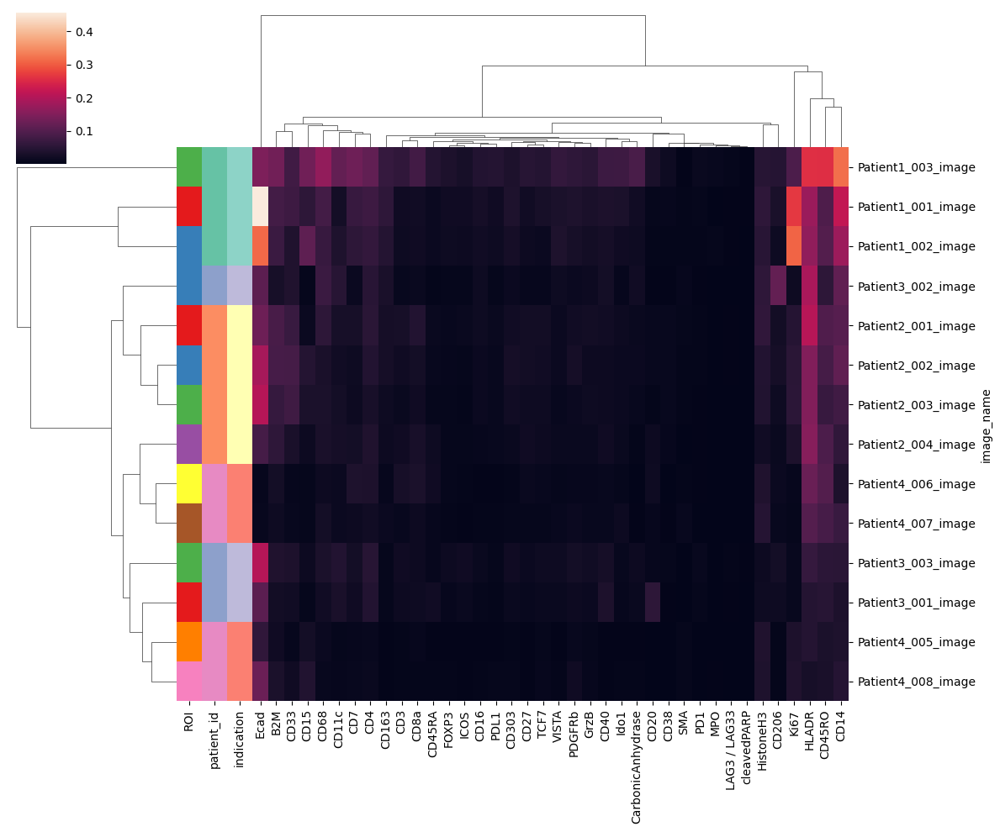

In [14]:
sp.pl.clustermap(df_norm, row_colors=sp.pl.make_cols_colors(df_metadata), figsize=(12, 10))

## Segmentation level quality control

<Axes: xlabel='Percentile of covered area', ylabel='name'>

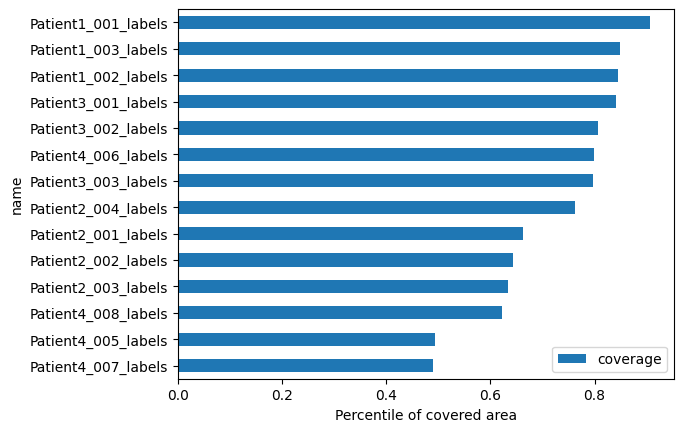

In [15]:
sp.pl.segmentation_coverage(sdata)

/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient1_001_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient1_002_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient1_003_labels', which is not present in the SpatialData object.
  self.validate_table_in_spatialdata(v)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/spatialdata/_core/spatialdata.py:158: UserWarning: The table is annotating 'Patient2_001_labels', which is not present in the 

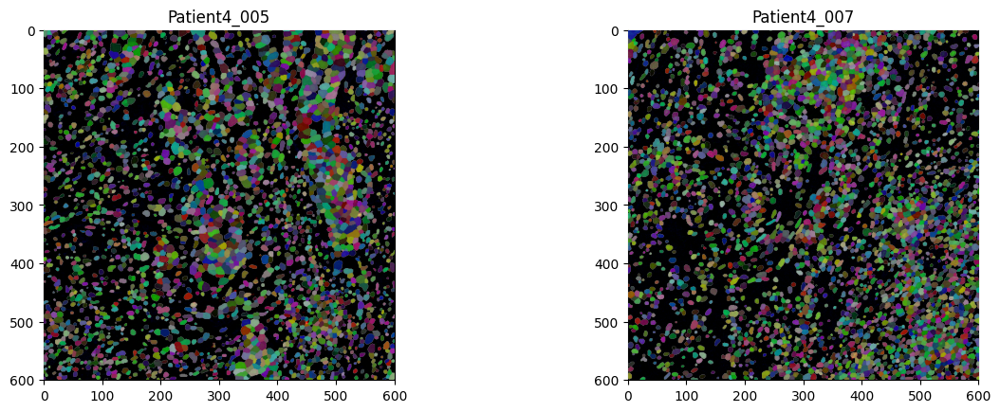

In [16]:
sdata.pl.render_images(channel=selected_markers).pl.render_labels().pl.show(coordinate_systems=["Patient4_005", "Patient4_007"])

/Users/benjaminr/Documents/GitHub/harpy/src/sparrow/plot/_qc_segmentation.py:36: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sdata.table.obs[["area", "sample_id"]].plot.box(by="sample_id", rot=45, ax=ax)


<Axes: title={'center': 'area'}>

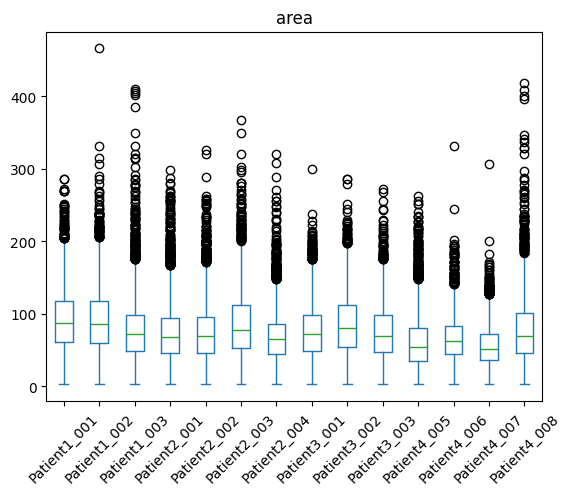

In [17]:
sp.pl.segmentation_size_boxplot(sdata)

In [18]:
sdata.table.obs["area"].describe()

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/3112437162.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table.obs["area"].describe()


count    47859.000000
mean        76.377296
std         41.443170
min          3.000000
25%         47.000000
50%         70.000000
75%         98.000000
max        466.000000
Name: area, dtype: float64

In [19]:
sum(sdata.table.obs["area"] < 5)

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/3707922682.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sum(sdata.table.obs["area"] < 5)


65

In [20]:
sdata.table[sdata.table.obs["area"] >= 5]

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/2937926262.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table[sdata.table.obs["area"] >= 5]


View of AnnData object with n_obs × n_vars = 47794 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'cell_id', 'region', 'sample_id', 'patient_id', 'ROI', 'indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'

In [21]:
sp.pl.calculate_segments_per_area(sdata)

/Users/benjaminr/Documents/GitHub/harpy/src/sparrow/plot/_qc_segmentation.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = sdata.table.obs.groupby("sample_id").agg(


,sample_id,image_width_px,image_height_px,cells_per_mm2
sample_id,,,,
Patient2_003,2612,600.0,600.0,7255.555556
Patient4_005,2795,600.0,600.0,7763.888889
Patient4_008,2845,600.0,600.0,7902.777778
Patient2_002,3033,600.0,600.0,8425.0
Patient4_007,3135,600.0,600.0,8708.333333
Patient2_001,3185,600.0,600.0,8847.222222
Patient1_002,3304,600.0,600.0,9177.777778
Patient3_002,3393,600.0,600.0,9425.0
Patient1_001,3567,600.0,600.0,9908.333333


/Users/benjaminr/Documents/GitHub/harpy/src/sparrow/plot/_qc_segmentation.py:16: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df = sdata.table.obs.groupby("sample_id").agg(


<Axes: xlabel='sample_id'>

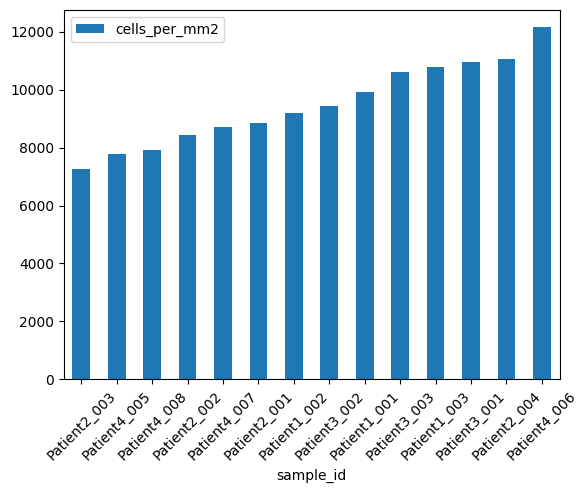

In [22]:
sp.pl.segments_per_area(sdata)

## Cell level quality control

In [23]:
import numpy as np

sdata.table.layers["arcsinh"] = np.arcsinh(sdata.table.to_df())

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/3156490613.py:3: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table.layers["arcsinh"] = np.arcsinh(sdata.table.to_df())


In [24]:
sdata.table

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/4181403938.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sdata.table


AnnData object with n_obs × n_vars = 47859 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'cell_id', 'region', 'sample_id', 'patient_id', 'ROI', 'indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'spatialdata_attrs'
    obsm: 'spatial'
    layers: 'arcsinh'

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/1883182048.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  used_var_names = [x for x in sdata.table.var_names if x not in ["DNA1", "DNA2"]]
/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/1883182048.py:2: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.tl.dendrogram(sdata.table, groupby="sample_id", var_names=used_var_names)
/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/1883182048.py:3: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pl.heatmap(sdata.table, layer="arcsinh", groupby="sample_id", var_names=used_var_names, swap_axes=True, dendrogram=True, figsize=(12, 10))


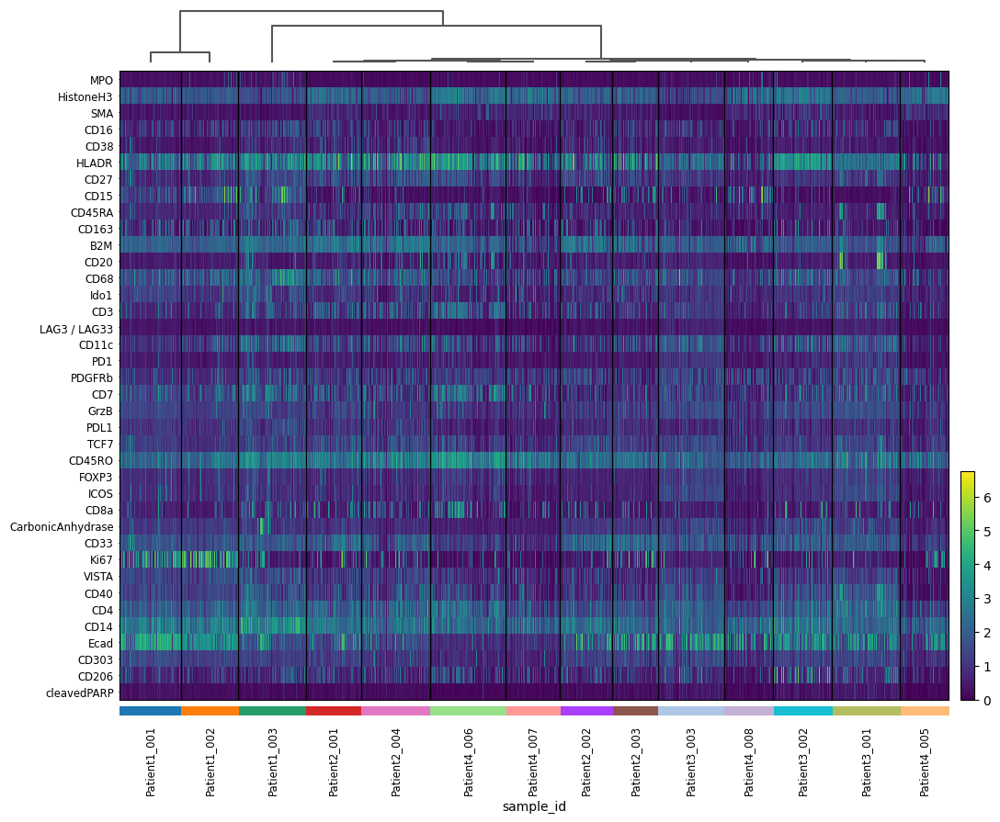

In [25]:
used_var_names = [x for x in sdata.table.var_names if x not in ["DNA1", "DNA2"]]
sc.tl.dendrogram(sdata.table, groupby="sample_id", var_names=used_var_names)
sc.pl.heatmap(sdata.table, layer="arcsinh", groupby="sample_id", var_names=used_var_names, swap_axes=True, dendrogram=True, figsize=(12, 10))

In [26]:
import seaborn as sns

def plot_ridgeplot(label_col_name, channel_col_name, data, is_save=False, save_path=''):
    """
    Plot ridgeplot
    """
    sns.set_theme(style="white", rc={"axes.facecolor": (0, 0, 0, 0), 'axes.linewidth':2})
    palette = sns.color_palette("Set2", 12)
    g = sns.FacetGrid(data, palette=palette, row=label_col_name, hue=label_col_name, aspect=9, height=1.2)
    g.map_dataframe(sns.kdeplot, x=channel_col_name, fill=True, alpha=1)
    g.map_dataframe(sns.kdeplot, x=channel_col_name, color="black")
    def label(x, color, label):
        ax = plt.gca()
        ax.text(0, .2, label, color='black', fontsize=13,
                ha="left", va="center", transform=ax.transAxes)

    g.map(label, label_col_name)
    g.fig.subplots_adjust(hspace=-.5)
    g.set_titles("")
    g.set(yticks=[], xlabel="mean intensity", ylabel="")
    g.despine( left=True)
    plt.suptitle(f'{channel_col_name}', y=0.98)
    if is_save:
        plt.savefig(save_path+f'/rp_{channel_col_name}.png')
    plt.show()

In [27]:
adata = sc.pp.subsample(sdata.table, fraction=0.1, copy=True)
adata

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_92941/135476782.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  adata = sc.pp.subsample(sdata.table, fraction=0.1, copy=True)


AnnData object with n_obs × n_vars = 4785 × 40
    obs: 'Image', 'area', 'centroid-0', 'centroid-1', 'axis_major_length', 'axis_minor_length', 'eccentricity', 'image', 'image_width_px', 'image_height_px', 'image_num_channels', 'image_source_file', 'image_recovery_file', 'image_recovered', 'image_acquisition_id', 'image_acquisition_description', 'image_acquisition_start_x_um', 'image_acquisition_start_y_um', 'image_acquisition_end_x_um', 'image_acquisition_end_y_um', 'image_acquisition_width_um', 'image_acquisition_height_um', 'cell_id', 'region', 'sample_id', 'patient_id', 'ROI', 'indication'
    var: 'channel', 'name', 'keep', 'ilastik', 'deepcell', 'Tube Number', 'Target', 'Antibody Clone', 'Stock Concentration', 'Final Concentration / Dilution', 'uL to add'
    uns: 'spatialdata_attrs', 'dendrogram_sample_id', 'sample_id_colors'
    obsm: 'spatial'
    layers: 'arcsinh'

/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/joypy/joyplot.py:176: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(by)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/joypy/joyplot.py:176: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = data.groupby(by)
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/joypy/joyplot.py:176: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or

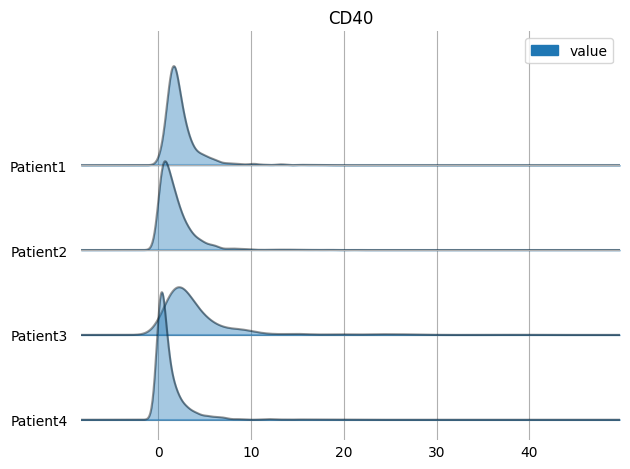

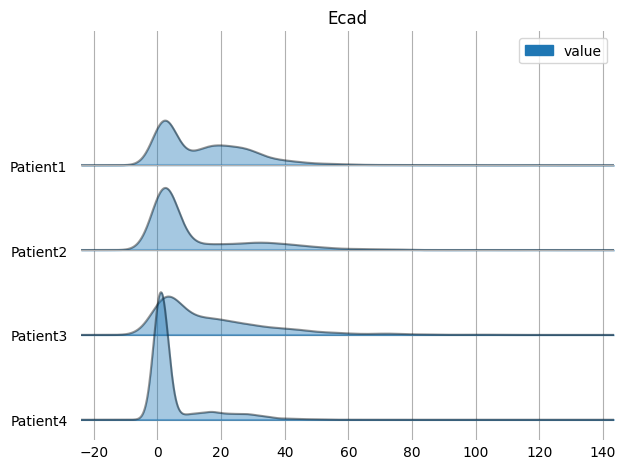

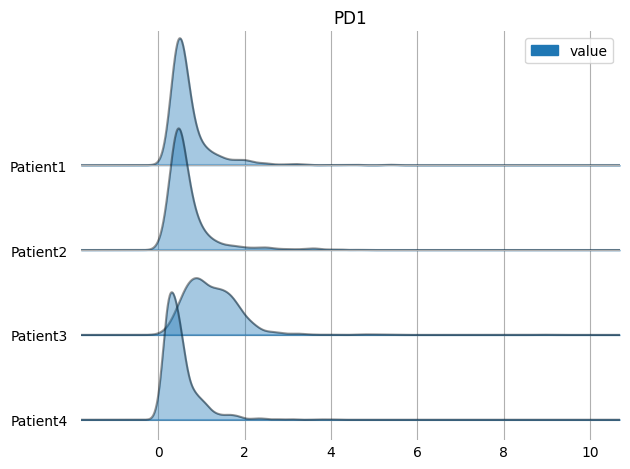

In [95]:
sp.pl.ridgeplot_channel_sample(adata, y='patient_id', value_vars=["Ecad", "CD40", "PD1"])

In [36]:
sc.pp.neighbors(sdata.table, n_neighbors=10, random_state=42)

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/418917352.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pp.neighbors(sdata.table, n_neighbors=10)
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.
/opt/homebrew/Caskroom/mambaforge/base/envs/harpy/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [42]:
sc.tl.umap(sdata.table, random_state=42)

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/1677724947.py:1: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.tl.umap(sdata.table, min_dist=0.2, random_state=42)


/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/2401644581.py:4: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pl.umap(sdata.table, color=c, ax=axs, show=False)
/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/2401644581.py:4: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pl.umap(sdata.table, color=c, ax=axs, show=False)
/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/2401644581.py:4: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pl.umap(sdata.table, color=c, ax=axs, show=False)


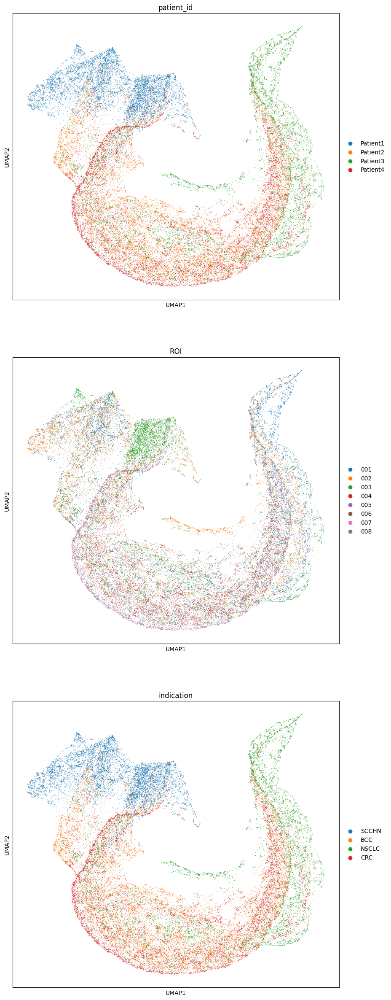

In [43]:
fig, axes = plt.subplots(3, 1, figsize=(10, 30))
markers = ["patient_id", "ROI", "indication"]
for c, axs in zip(markers, axes):
    sc.pl.umap(sdata.table, color=c, ax=axs, show=False)

/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/2204917557.py:4: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pl.umap(sdata.table, color=c, ax=axs, show=False)
/var/folders/_7/w0gk4q1n3sl8pmknc_rwb39h0000gp/T/ipykernel_2829/2204917557.py:4: DeprecationWarning: Table accessor will be deprecated with SpatialData version 0.1, use sdata.tables instead.
  sc.pl.umap(sdata.table, color=c, ax=axs, show=False)


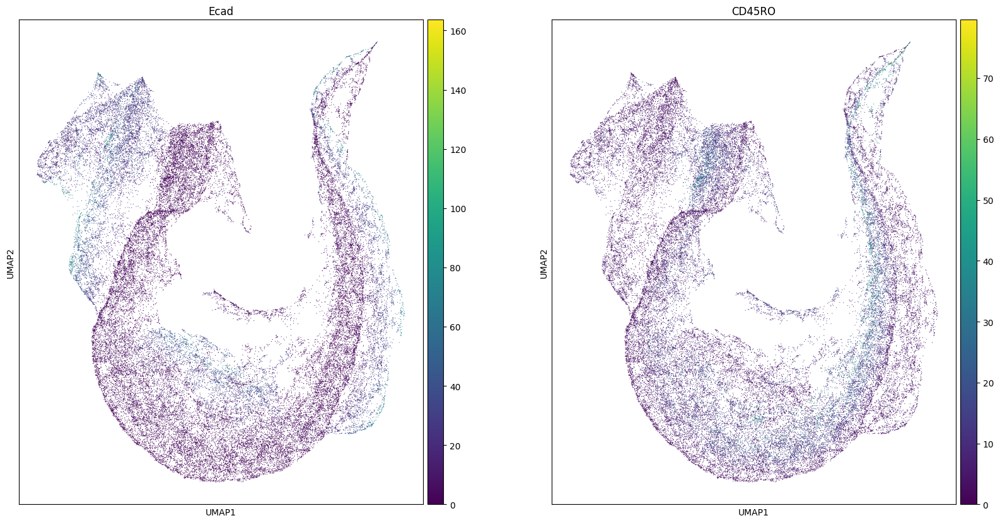

In [44]:
fig, axes = plt.subplots(1, 2, figsize=(20, 10))
markers = ["Ecad", "CD45RO"]
for c, axs in zip(markers, axes):
    sc.pl.umap(sdata.table, color=c, ax=axs, show=False)